## Gaussian Distribution

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

In [2]:
mu = 20
sigma = 5
x_min = -25
x_max = 25

### Z-Score

In [3]:
z_min = (x_min + mu ) / sigma
z_max = ( x_max - mu ) / sigma
z_min, z_max

(-1.0, 1.0)

In [4]:
x = np.arange(z_min, z_max, 0.001) # 1 standard deviation away from the mean
x_all = np.arange(-10, 10, 0.001)  # entire range of x, both in and out of spec
y = norm.pdf(x,0,1)
y2 = norm.pdf(x_all,0,1)
y2

array([7.69459863e-23, 7.77192674e-23, 7.85002413e-23, ...,
       7.92889836e-23, 7.85002413e-23, 7.77192674e-23])

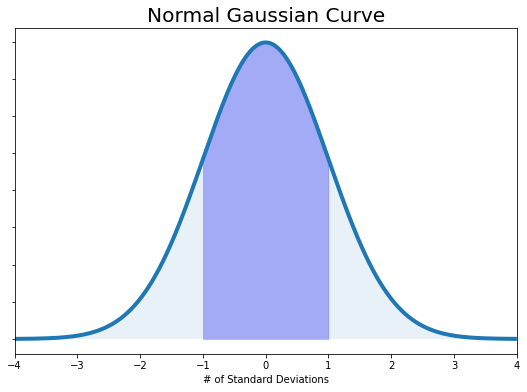

In [5]:
fig, ax = plt.subplots(figsize=(9,6))
plt.style.use('fivethirtyeight')
ax.plot(x_all,y2)

ax.fill_between(x,y,0, alpha=0.3, color='b')
ax.fill_between(x_all,y2,0, alpha=0.1)
ax.set_xlim([-4,4])
ax.set_xlabel('# of Standard Deviations')
ax.set_yticklabels([])
ax.set_title('Normal Gaussian Curve')

#plt.savefig('normal_curve.png', dpi=72, bbox_inches='tight')
plt.show()

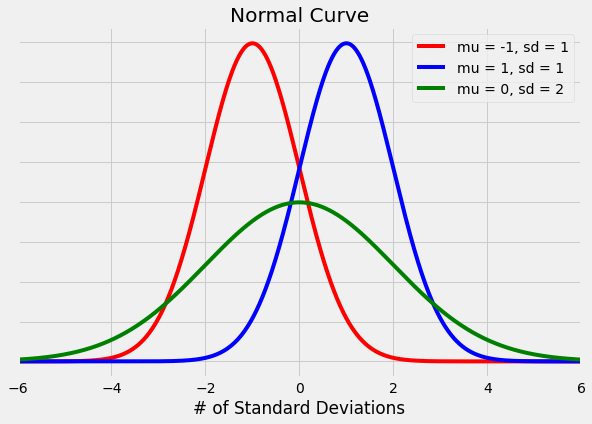

In [6]:
y = norm.pdf(x_all,-1,1)
y2 = norm.pdf(x_all,1,1)
y3 = norm.pdf(x_all,0,2)

fig, ax = plt.subplots(figsize=(9,6))
plt.style.use('fivethirtyeight')
ax.plot(x_all,y, color = 'r', label = "mu = -1, sd = 1")
ax.plot(x_all,y2,color='b', label = "mu = 1, sd = 1")
ax.plot(x_all,y3,color='g', label = "mu = 0, sd = 2")

ax.set_xlim([-6,6])
ax.set_xlabel('# of Standard Deviations')
ax.set_yticklabels([])
ax.set_title('Normal Curve')
plt.legend()

#plt.savefig('normal_curve_diff.png', dpi=72, bbox_inches='tight')
plt.show()

In [7]:
## Multivariate Gaussian

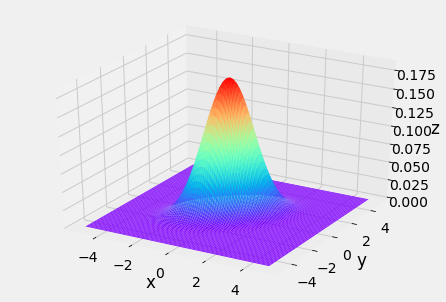

In [8]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x, y)
pos = np.dstack((X, Y))
mu = np.array([0, 0])
cov = np.array([[1, .5],[.5, 1]])
Z = multivariate_normal.pdf(pos, mu, cov)

fig = plt.figure()
ax = Axes3D(fig)
ax.plot_surface(X, Y, Z, cmap='rainbow', rstride=1, cstride=1)
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
#fig.savefig('multigaussian.png', dpi=72, bbox_inches='tight')
fig.show()

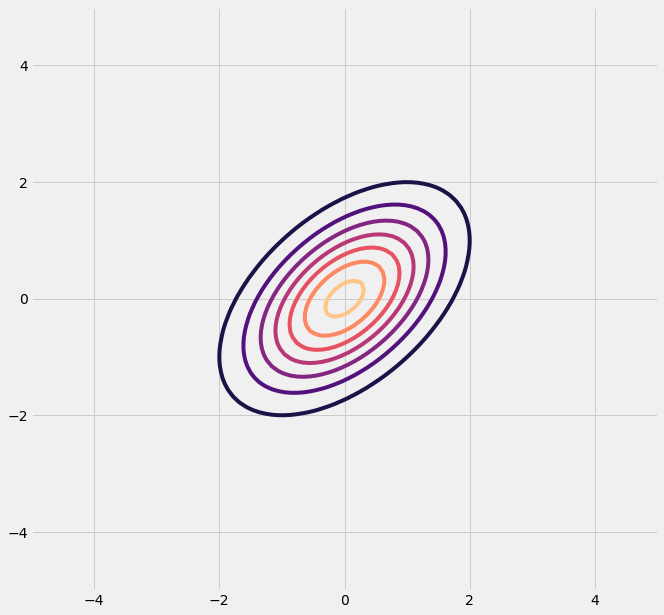

In [9]:
fig = plt.figure(figsize=(10,10))
con = fig.add_subplot(111)
con.contour(X, Y, Z,cmap='magma')
#fig.savefig('multigaussian_contour.png', dpi=72, bbox_inches='tight')

plt.show()

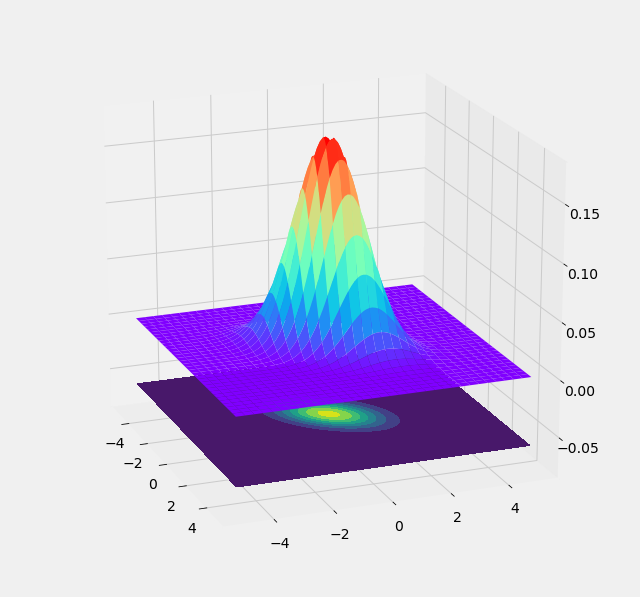

In [10]:
fig = plt.figure(figsize=(10,10))
ax = fig.gca(projection='3d')
ax.plot_surface(X, Y, Z, rstride=3,  cmap='rainbow',cstride=3, linewidth=1, antialiased=True)
ax.contourf(X, Y, Z, zdir='z', offset=-0.06)
ax.set_zlim(-0.08,0.18)
ax.view_init(20, -21)

#fig.savefig('Gauss_contour.png', dpi=72, bbox_inches='tight')
fig.show()

## KNN: K-Nearest Neighbors algorithm

In [1]:
from sklearn.datasets import load_wine
from sklearn.neighbors import  KNeighborsClassifier
import numpy as np
winedata = load_wine()

feature_names = winedata.feature_names
print(feature_names)

['alcohol', 'malic_acid', 'ash', 'alcalinity_of_ash', 'magnesium', 'total_phenols', 'flavanoids', 'nonflavanoid_phenols', 'proanthocyanins', 'color_intensity', 'hue', 'od280/od315_of_diluted_wines', 'proline']


In [2]:

from sklearn.linear_model import LassoCV, LogisticRegression

data_x = winedata.data
data_y = winedata.target
Lasso_algo = LassoCV().fit(data_x, data_y)
shrinking = np.abs(Lasso_algo.coef_)
features_index = (-shrinking).argsort()[:2]

data_x = data_x [:,features_index  ]


In [4]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(data_x,data_y,test_size=0.2)

In [5]:
knn = KNeighborsClassifier(n_neighbors=10, weights= "uniform")
knn.fit(x_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=10, p=2,
                     weights='uniform')

In [6]:
from sklearn.metrics import classification_report
y_pred = knn.predict(x_test)
print(classification_report(y_test, y_pred, target_names=winedata.target_names))

precision    recall  f1-score   support

     class_0       0.89      1.00      0.94         8
     class_1       0.92      0.86      0.89        14
     class_2       0.93      0.93      0.93        14

    accuracy                           0.92        36
   macro avg       0.91      0.93      0.92        36
weighted avg       0.92      0.92      0.92        36



In [16]:
from sklearn.linear_model import LogisticRegression
Logistic_reg = LogisticRegression()
Logistic_reg.fit(x_train,y_train)
y_pred2 = Logistic_reg.predict(x_test)
print(classification_report(y_test, y_pred2, target_names=winedata.target_names))

precision    recall  f1-score   support

     class_0       0.92      0.85      0.88        13
     class_1       0.88      0.88      0.88        17
     class_2       0.86      1.00      0.92         6

    accuracy                           0.89        36
   macro avg       0.89      0.91      0.90        36
weighted avg       0.89      0.89      0.89        36



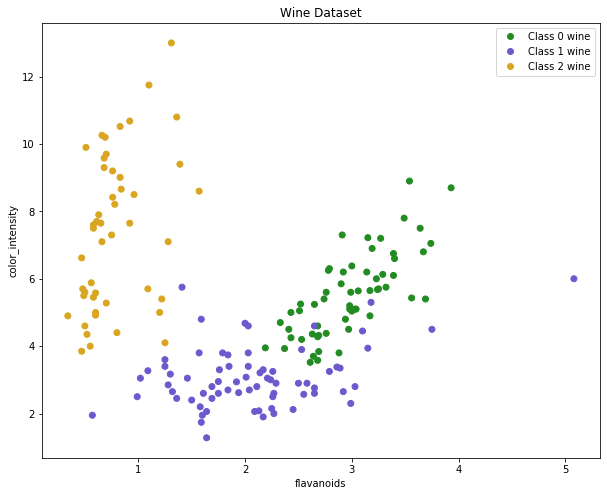

In [11]:
import matplotlib 
feature_1 =  x_train[:,0] # flavanoids
feature_2 = x_train[:,1] # color_intensity
label = y_train
  
 
plt.figure(figsize=(10,8))
classes = ['Class 0 wine', 'Class 1 wine', 'Class 2 wine']
colors = [ 'forestgreen','slateblue', 'goldenrod']
scatter = plt.scatter(data_x[:,0],data_x[:,1],  c=data_y,cmap = mcolors.ListedColormap(colors), marker='o' ,label='test data')
plt.xlabel("flavanoids")
plt.ylabel("color_intensity")
plt.legend(handles=scatter.legend_elements()[0], labels=classes)
plt.title('Wine Dataset')
#plt.savefig('wine_data.png', dpi=72, bbox_inches='tight')

plt.show()

In [8]:
import matplotlib.colors as mcolors
feature_1 =  x_train[:,0] # flavanoids
feature_2 = x_train[:,1] # color_intensity
label = y_train
 

plt.figure(figsize=(10,8))
classes = ['Class 0 wine', 'Class 1 wine', 'Class 2 wine']
colors = [ 'forestgreen','slateblue', 'goldenrod']
scatter = plt.scatter(feature_1, feature_2, c= label, cmap = mcolors.ListedColormap(colors))
#scatter2 = plt.scatter(x_test[:,0], x_test[:,1],  c=y_test,cmap = mcolors.ListedColormap(colors), marker='x', s=200. ,label='test data')
plt.xlabel("flavanoids")
plt.ylabel("color_intensity")
plt.legend(handles=scatter.legend_elements()[0], labels=classes)
plt.title('Wine Dataset')
#plt.savefig('wine_data.png', dpi=72, bbox_inches='tight')

plt.show()

NameError: name 'plt' is not defined

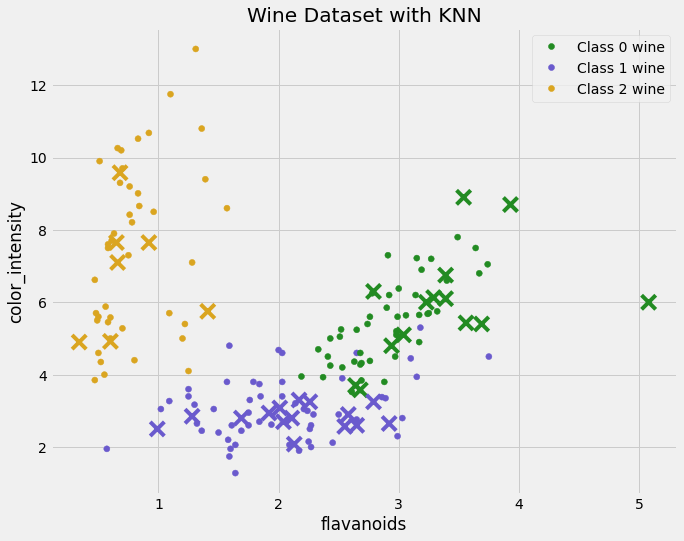

In [19]:
import matplotlib.colors as mcolors
feature_1 =  x_train[:,0] # flavanoids
feature_2 = x_train[:,1] # color_intensity
label = y_train
 
plt.figure(figsize=(10,8))
classes = ['Class 0 wine', 'Class 1 wine', 'Class 2 wine']
colors = [ 'forestgreen','slateblue', 'goldenrod']
scatter = plt.scatter(feature_1, feature_2, c= label, cmap = mcolors.ListedColormap(colors))
scatter2 = plt.scatter(x_test[:,0], x_test[:,1],  c=y_pred, cmap = mcolors.ListedColormap(colors), marker='x', s=200. ,label='test data')
plt.xlabel("flavanoids")
plt.ylabel("color_intensity")
plt.legend(handles=scatter.legend_elements()[0], labels=classes)
plt.title('Wine Dataset with KNN')
#plt.savefig('wine_data_knn.png', dpi=72, bbox_inches='tight')

plt.show()

In [20]:
inx = np.where(data_y ==1 )[0]
class_1_y = data_y [inx ]
class_1_x = data_x [inx,]


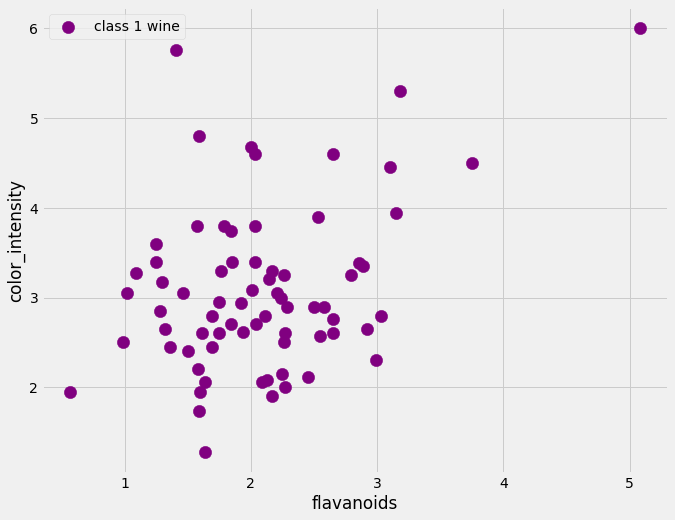

In [21]:
plt.figure(figsize=(10,8))
 
scatter= plt.scatter(class_1_x[:,0], class_1_x[:,1],  c='purple', marker='o', s=150. ,label='class 1 wine')
plt.xlabel("flavanoids")
plt.ylabel("color_intensity")
plt.legend()
#plt.savefig('wine_data_Class_1.png', dpi=72, bbox_inches='tight')
plt.show()

## Isolation Forest

In [22]:
from sklearn.ensemble import IsolationForest

clf = IsolationForest( contamination = 'auto')

clf.fit(class_1_x)
IFprediction = clf.predict(class_1_x)

In [23]:
anom_ind = np.where(IFprediction < 0)
anom_ind

(array([ 0,  2,  4,  6,  7,  8, 17, 22, 24, 37, 39, 40, 60, 62, 67],
       dtype=int64),)

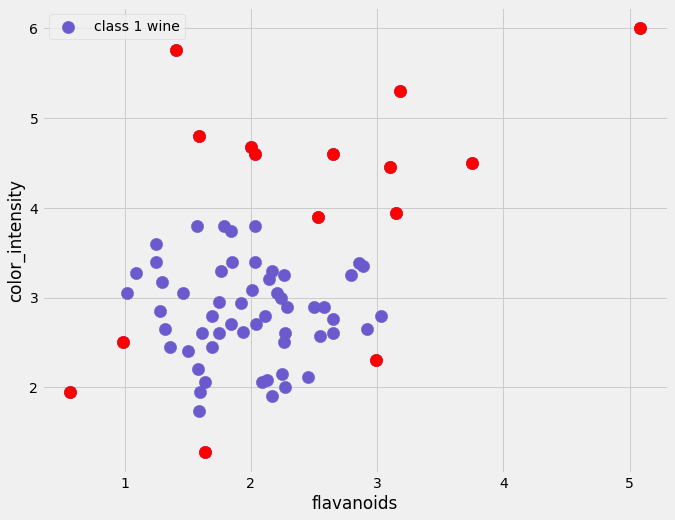

In [24]:
plt.figure(figsize=(10,8))
 
scatter= plt.scatter(class_1_x[:,0], class_1_x[:,1],  c='slateblue', marker='o', s=150. ,label='class 1 wine')
scatter2 = plt.scatter(class_1_x[anom_ind,0], class_1_x[anom_ind,1], c='r',  marker='o', s=150.)
plt.xlabel("flavanoids")
plt.ylabel("color_intensity")
plt.legend()
plt.savefig('wine_data_iForest.png', dpi=72, bbox_inches='tight')
plt.show()

## K-Means
### Load in required data from data file

In [2]:
os.chdir('C:\\Users\\rache\\Downloads\\dsbook')
Data_Path =os.path.join ('Data')

import pandas as pd
csv_path1 = os.path.join (Data_Path , 'ASRS.csv')
csv_path2 = os.path.join (Data_Path , 'AQ.csv')
ASRS = pd.read_csv(csv_path1)
AQ = pd.read_csv(csv_path2)

In [3]:
ASRS.head()

,ID code,ASRS01,ASRS02,ASRS03,ASRS04,ASRS05,ASRS06,ASRS07,ASRS08,ASRS09,ASRS10,ASRS11,ASRS12,ASRS13,ASRS14,ASRS15,ASRS16,ASRS17,ASRS18
0,qanXRxtJ,1,3,1,3,4,0,1,2,1,1,1,0,1,0,1,2,1,1
1,439255,2,1,1,0,3,4,1,2,2,1,2,1,4,3,2,2,3,1
2,rZdt8NSK,2,3,0,2,2,2,2,3,3,2,3,1,1,3,1,4,3,3
3,IXePNvsw,1,1,1,2,2,2,2,2,3,1,2,1,3,1,1,2,1,1
4,1848,1,2,1,2,2,1,2,1,1,2,2,0,1,1,1,0,1,1


In [4]:
AQ.head()

,ID code,AQ01,AQ02,AQ03,AQ04,AQ05,AQ06,AQ07,AQ08,AQ09,...,AQ41,AQ42,AQ43,AQ44,AQ45,AQ46,AQ47,AQ48,AQ49,AQ50
0,qanXRxtJ,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,439255,1,1,0,1,1,1,1,0,0,...,0,1,1,0,1,0,1,0,0,1
2,rZdt8NSK,1,0,0,1,1,0,0,0,0,...,0,1,0,1,0,1,0,0,0,1
3,IXePNvsw,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1848,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


### Due to the confidential, the respondents' names were not recorded ; these were replaced by random numbers and letters. 
### ASRS__ are the questions:

## PART A
#### ASRS01	How often do you have trouble wrapping up the final details of a project, once the challenging parts have been done?

#### ASRS02	How often do you have difficulty getting things in order when you have to do a task that requires organization?

#### ASRS03	How often do you have problems remembering appointments or obligations?

#### ASRS04	When you have a task that requires a lot of thought, how often do you avoid or delay getting started?

#### ASRS05	How often do you fidget or squirm with your hands or feet when you have to sit down for a long time?

#### ASRS06	How often do you feel overly active and compelled to do things, like you were driven by a motor?

#### ASRS07	How often do you make careless mistakes when you have to work on a boring or difficult project?

#### ASRS08	How often do you have difficulty keeping your attention when you are doing boring or repetitive work?

#### ASRS09	How often do you have difficulty concentrating on what people say to you, even when they are speaking to you directly?

## PART B

#### ASRS10	How often do you misplace or have difficulty finding things at home or at work?

#### ASRS11	How often are you distracted by activity or noise around you?

#### ASRS12	How often do you leave your seat in meetings or other situations in which you are expected to remain seated?

#### ASRS13	How often do you feel restless or fidgety?

#### ASRS14	How often do you have difficulty unwinding and relaxing when you have time to yourself?

#### ASRS15	How often do you find yourself talking too much when you are in social situations?

#### ASRS16	When you’re in a conversation, how often do you find yourself finishing the sentences of the people you are talking to, before they can finish them themselves?

#### ASRS17	How often do you have difficulty waiting your turn in situations when turn taking is required?

#### ASRS18	How often do you interrupt others when they are busy?


## The questions above are listed in self-report questionaire, it is designed to be two parts:
### Part A score: inattentive, Part B score: Hyperactive/Impulsive. 
### If the score is in the likely or highly likely category for either Part A or B, then the patient has symptoms consistent with ADHD. 


### S0-16: Unlikely to have ADHD, 17-23 Likely to have ADHD, 24 or greater highly likely to have ADHD


In [5]:
feature_A =   ASRS.iloc[:, :9].sum(axis=1).values
feature_B = ASRS.iloc[:, 9 :].sum(axis=1).values
feature_C = AQ.sum(axis =1).values
ASRS

,ID code,ASRS01,ASRS02,ASRS03,ASRS04,ASRS05,ASRS06,ASRS07,ASRS08,ASRS09,ASRS10,ASRS11,ASRS12,ASRS13,ASRS14,ASRS15,ASRS16,ASRS17,ASRS18
0,qanXRxtJ,1,3,1,3,4,0,1,2,1,1,1,0,1,0,1,2,1,1
1,439255,2,1,1,0,3,4,1,2,2,1,2,1,4,3,2,2,3,1
2,rZdt8NSK,2,3,0,2,2,2,2,3,3,2,3,1,1,3,1,4,3,3
3,IXePNvsw,1,1,1,2,2,2,2,2,3,1,2,1,3,1,1,2,1,1
4,1848,1,2,1,2,2,1,2,1,1,2,2,0,1,1,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
920,Ik3SZQza,4,2,3,0,3,1,1,2,2,1,2,0,3,1,3,1,3,3
921,FHyBOlxd,3,3,0,3,3,3,3,3,2,3,2,2,3,2,3,3,3,2
922,816ls0Qr,0,4,1,4,4,0,1,4,1,0,1,0,1,1,4,0,0,1
923,KZ2d5elM,1,1,0,0,2,0,2,2,0,0,1,0,1,0,1,1,0,0


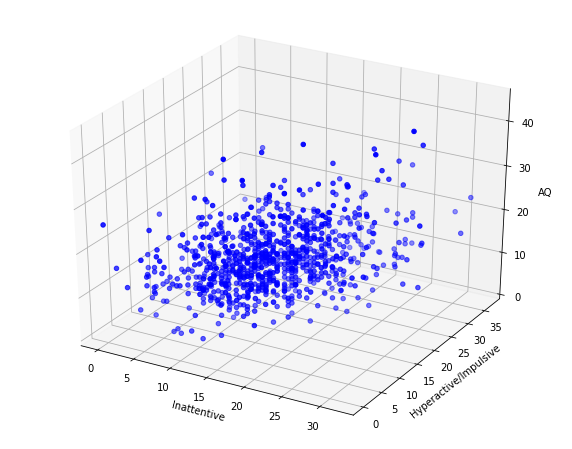

In [6]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
colors = [ 'slateblue', 'forestgreen','goldenrod']
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(feature_A, feature_B, feature_C, c='b', marker='o')
ax.set_xlabel('Inattentive')
ax.set_ylabel('Hyperactive/Impulsive')
ax.set_zlabel('AQ')

#plt.savefig('asrs_aq.png', dpi=72, bbox_inches='tight')
plt.show()

No handles with labels found to put in legend.


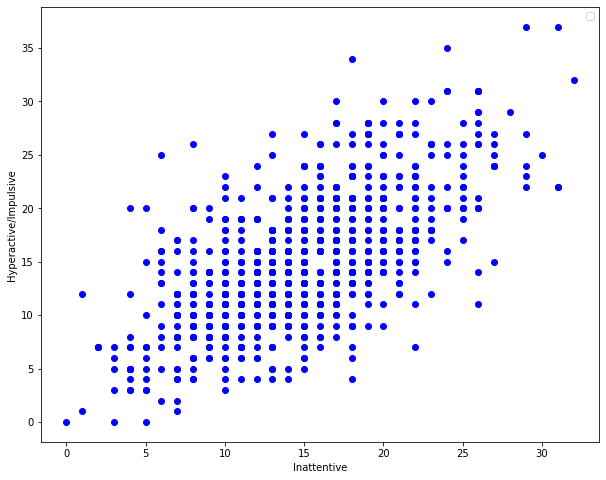

In [7]:
 
plt.figure(figsize=(10,8))
 
plt.scatter(feature_A, feature_B, c='b',  marker='o')
plt.xlabel("Inattentive")
plt.ylabel("Hyperactive/Impulsive")
plt.legend()
#plt.savefig('asrs.png', dpi=72, bbox_inches='tight')

In [8]:
import numpy as np
ASRS_X = pd.DataFrame()
ASRS_X ['Inattentive'] = feature_A
ASRS_X ['Hyperactive'] = feature_B
ASRS_X ['AQ'] = feature_C


In [9]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, random_state=1).fit(ASRS_X)

label = kmeans.labels_
label[:10] # show first 10 labels 

array([0, 2, 1, 0, 0, 0, 2, 0, 0, 1])

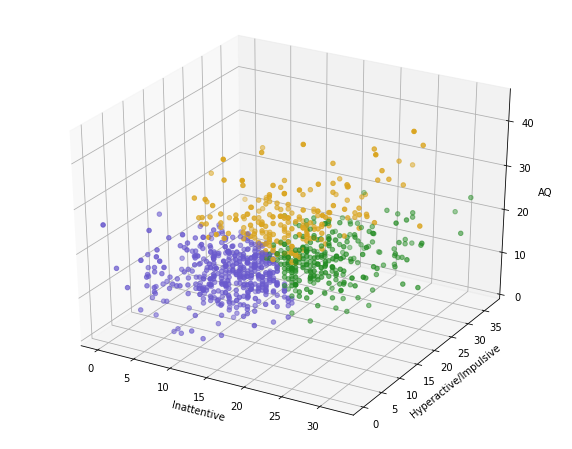

In [10]:
import matplotlib.colors as mcolors
colors = [ 'slateblue', 'forestgreen','goldenrod']
attribute = list(ASRS_X.columns)
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(feature_A, feature_B, feature_C, c= label, cmap = mcolors.ListedColormap(colors))
ax.set_xlabel('Inattentive')
ax.set_ylabel('Hyperactive/Impulsive')
ax.set_zlabel('AQ')
 
#plt.savefig('ASRS_data_kmeans.png', dpi=72, bbox_inches='tight')

plt.show()

In [11]:
from sklearn.cluster import KMeans
kmeans_wine = KMeans(n_clusters=3, random_state=1).fit(data_x)

feature_1 = data_x[:,0] # flavanoids
feature_2 = data_x[:,1] # color_intensity
label_wine_kmeans = kmeans_wine.labels_
plt.figure(figsize=(10,8))
classes = ['Class 0 wine', 'Class 1 wine', 'Class 2 wine']
colors = ['forestgreen', 'slateblue', 'goldenrod']
 
scatter = plt.scatter(feature_1, feature_2, c= label_wine_kmeans , cmap = mcolors.ListedColormap(colors))

plt.xlabel("flavanoids")
plt.ylabel("color_intensity")
plt.legend(handles=scatter.legend_elements()[0], labels=classes)
plt.title('Wine Dataset with Kmeans')
#plt.savefig('Wine_data_kmeans.png', dpi=72, bbox_inches='tight')
plt.show()

NameError: name 'data_x' is not defined

### K-Means is a logically simple clustering method, the general idea is to divide the data into multiple clusters, each cluster is a category. Each cluster has a centroid, ie. the center point of a cluster, obtain from iterative learning. Therefore, the centorid is the average of all isntances within its class.

## Gaussian Mixture Model
### Another popular clustering method, the concept of "Probability" is introduced. In a probability model, we always work with P(Y|X) - Probability of Y given X.  In context of classification prcess, we obtain a probability distribution of the value of Y through the random variable X. Though in this case, the output is not a specific value, but the probability corresponding to each different class is obtain. This will allow us to select an instance with the highest probability as the decision object (or the centroid of the cluster)


## Gaussian Mixture Model on Wine Dataset

In [12]:
from matplotlib.colors import LogNorm
from sklearn.mixture import GaussianMixture

gmm_clf = GaussianMixture(n_components=3,covariance_type='full', random_state =1)
gmm_clf.fit(data_x)
feature_1 = data_x[:,0] # flavanoids
feature_2 = data_x[:,1] # color_intensity
label = gmm_clf.predict(data_x)

plt.figure(figsize=(10,8))
classes = ['Class 0 wine', 'Class 1 wine', 'Class 2 wine']
colors = [ 'forestgreen','slateblue', 'goldenrod']

x = np.linspace(0., 5.)
y = np.linspace(0., 15.)
X, Y = np.meshgrid(x, y)
XX = np.array([X.ravel(), Y.ravel()]).T
Z = -gmm_clf.score_samples(XX)
Z = Z.reshape(X.shape)

CS = plt.contour(X, Y, Z, norm=LogNorm( ),
                 levels=np.logspace(0,1, 15))
CB = plt.colorbar(CS, shrink=1, extend='both')
plt.scatter(feature_1, feature_2, c= label, cmap = mcolors.ListedColormap(colors))

plt.xlabel("flavanoids")
plt.ylabel("color_intensity")
plt.legend(handles=scatter.legend_elements()[0], labels=classes)
plt.title('Wine Dataset with GMM')
#plt.savefig('Wine_data_GMM.png', dpi=72, bbox_inches='tight')
plt.show()

NameError: name 'data_x' is not defined

In [13]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=3,covariance_type='full').fit(ASRS_X)
label2 = gmm.predict(ASRS_X)

<Figure size 720x576 with 0 Axes>

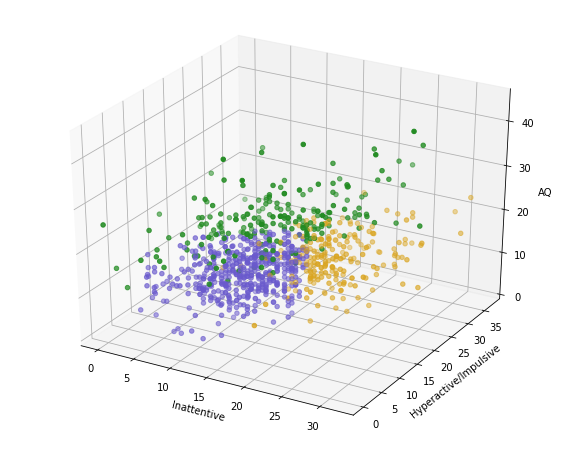

In [14]:
from matplotlib.colors import LogNorm
from mpl_toolkits.mplot3d import axes3d
plt.figure(figsize=(10,8))
 
colors = [ 'forestgreen','goldenrod','slateblue' ]
attribute = list(ASRS_X.columns)
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
 

ax.scatter(feature_A, feature_B, feature_C, c= label2, cmap = mcolors.ListedColormap(colors))
 
ax.set_xlabel('Inattentive')
ax.set_ylabel('Hyperactive/Impulsive')
ax.set_zlabel('AQ')
 
#plt.savefig('ASRS_data_GMM.png', dpi=72, bbox_inches='tight')

plt.show()

## Hierarchical clustering

In [15]:
from sklearn.cluster import AgglomerativeClustering
Hie_clus = AgglomerativeClustering(n_clusters=3, distance_threshold =None, linkage='ward', affinity='euclidean').fit(ASRS_X)

label3 = Hie_clus.labels_

## Linkage:
### Ward minimizes the sum of squared differences within all clusters. It is a variance-minimizing approach and in this sense is similar to the k-means objective function but tackled with an agglomerative hierarchical approach.
### Maximum or complete linkage minimizes the maximum distance between observations of pairs of clusters.
### Average linkage minimizes the average of the distances between all observations of pairs of clusters.
### Single linkage minimizes the distance between the closest observations of pairs of clusters.

<Figure size 720x576 with 0 Axes>

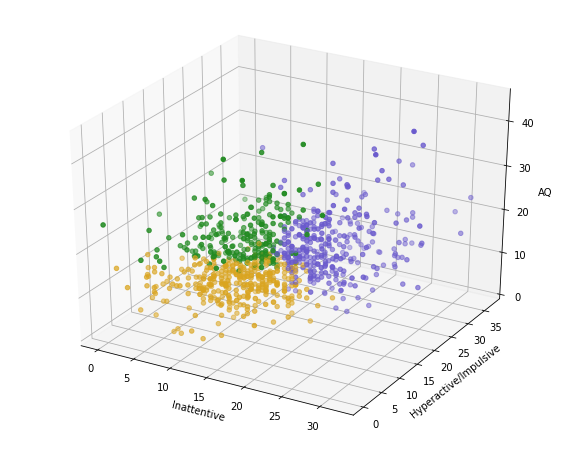

In [16]:

plt.figure(figsize=(10,8))
classes =  [ 'Less likely', 'likely','highly likely']
colors = ['slateblue', 'goldenrod','forestgreen']
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
 

ax.scatter(feature_A, feature_B, feature_C, c= label3, cmap = mcolors.ListedColormap(colors))
 
ax.set_xlabel('Inattentive')
ax.set_ylabel('Hyperactive/Impulsive')
ax.set_zlabel('AQ')
 

#plt.savefig('ASRS_data_Hierarchical.png', dpi=72, bbox_inches='tight')

plt.show()

In [17]:
from scipy.cluster.hierarchy import dendrogram
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

model_wine = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage='ward' )

model_wine = model_wine.fit(data_x)
plt.title('Hierarchical Clustering Dendrogram for wine dataset')
# plot the top three levels of the dendrogram
plot_dendrogram(model_wine)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")

#plt.savefig('wine_data_dendrogram.png', dpi=72, bbox_inches='tight')
plt.show()

NameError: name 'data_x' is not defined

In [18]:
label_agglo = model_wine.labels_


plt.figure(figsize=(10,8))
classes = ['Class 0 wine', 'Class 1 wine', 'Class 2 wine']
colors = [ 'goldenrod','slateblue', 'forestgreen']
 
plt.scatter(feature_1, feature_2, c=label_agglo, cmap = mcolors.ListedColormap(colors))

plt.xlabel("flavanoids")
plt.ylabel("color_intensity")
plt.legend(handles=scatter.legend_elements()[0], labels=classes)
plt.title('Wine Dataset with GMM')
#plt.savefig('Wine_data_agg.png', dpi=72, bbox_inches='tight')
plt.show()

AttributeError: 'AgglomerativeClustering' object has no attribute 'labels_'

In [19]:
## 6factors from the origin paper.

In [20]:
factor_1=   AQ[["AQ01", "AQ11", "AQ13", "AQ15", "AQ17", "AQ22", "AQ26", "AQ34", "AQ38", "AQ44",  "AQ46", "AQ47"]].sum(axis=1).values
factor_2=   AQ[["AQ05", "AQ06", "AQ09", "AQ12", "AQ19", "AQ23", "AQ29"]].sum(axis=1).values
factor_3=   AQ[["AQ07", "AQ18", "AQ39"]].sum(axis=1).values + ASRS[["ASRS15","ASRS16","ASRS17","ASRS18"]].sum(axis=1).values
factor_4=   AQ[["AQ03", "AQ08", "AQ20","AQ20","AQ27","AQ31","AQ36","AQ45"]].sum(axis=1).values
factor_5=  ASRS[["ASRS01","ASRS02","ASRS03","ASRS04", "ASRS08","ASRS10"]].sum(axis=1).values
factor_6=  ASRS[["ASRS05","ASRS06","ASRS08","ASRS13", "ASRS14"]].sum(axis=1).values

In [34]:
Factors_set = pd.DataFrame()
Factors_set['Social Interaction Impariment'] = factor_1
Factors_set['Focus on details'] = factor_2
Factors_set['Social impulsivity'] = factor_3
Factors_set['Theory of mind'] = factor_4
Factors_set['Inattention'] = factor_5
Factors_set['Hyperactivity'] = factor_6
Factors_set.head()

,Social Interaction Impariment,Focus on details,Social impulsivity,Theory of mind,Inattention,Hyperactivity
0,1,3,5,1,11,7
1,4,4,11,1,7,16
2,8,2,11,0,12,11
3,2,3,5,0,8,10
4,2,1,3,0,9,6


In [35]:
factor_name = Factors_set.columns

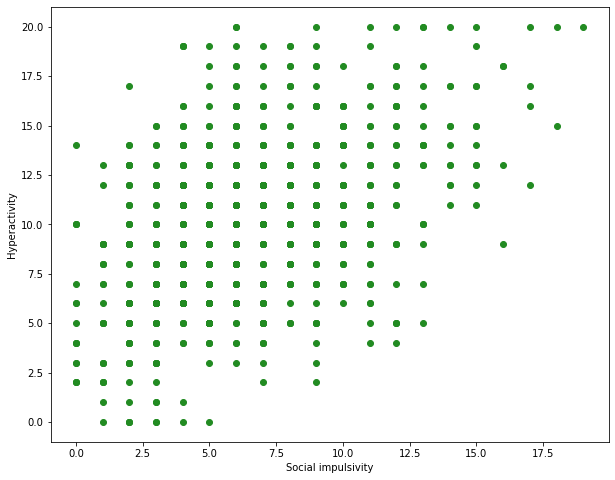

In [36]:
factor_name = Factors_set.columns

plt.figure(figsize=(10,8))
 

plt.scatter(Factors_set['Social impulsivity'], Factors_set[ 'Hyperactivity'] ,c= 'forestgreen')
 
plt.xlabel(factor_name[2])
plt.ylabel(factor_name[5])

 

#plt.savefig('2D_DM.png', dpi=72, bbox_inches='tight')

plt.show()

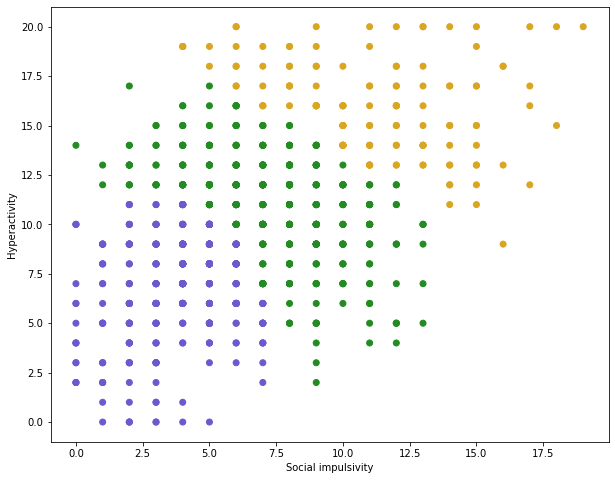

In [37]:
train_2DM = Factors_set[['Social impulsivity' ,  'Hyperactivity'  ]]
colors = ['slateblue', 'goldenrod','forestgreen']
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=3,covariance_type='full', random_state=1).fit(train_2DM )
label_2DM = gmm.predict(train_2DM )
plt.figure(figsize=(10,8))
 

plt.scatter(Factors_set['Social impulsivity'], Factors_set[ 'Hyperactivity'] ,c= label_2DM, cmap = mcolors.ListedColormap(colors))
 
plt.xlabel(factor_name[2])
plt.ylabel(factor_name[5])

 

#plt.savefig('2D_DM_gmm.png', dpi=72, bbox_inches='tight')

plt.show()

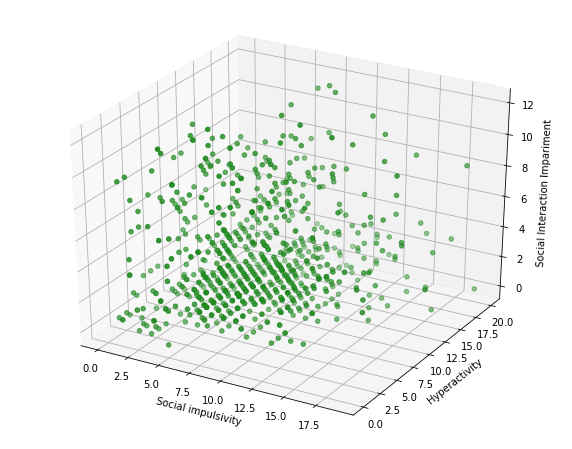

In [38]:
 
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
 

ax.scatter(Factors_set['Social impulsivity'], Factors_set['Hyperactivity'] , Factors_set['Social Interaction Impariment'],  c= 'forestgreen')
 
ax.set_xlabel(factor_name[2])
ax.set_ylabel(factor_name[5])
ax.set_zlabel(factor_name[0])
 

#plt.savefig('3D_DM.png', dpi=72, bbox_inches='tight')

plt.show()

In [39]:
train_DM = Factors_set[['Social impulsivity' ,  'Hyperactivity'  ,  'Social Interaction Impariment']]

from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=3,covariance_type='full', random_state=1).fit(train_DM )
label_DM = gmm.predict(train_DM )

<Figure size 720x576 with 0 Axes>

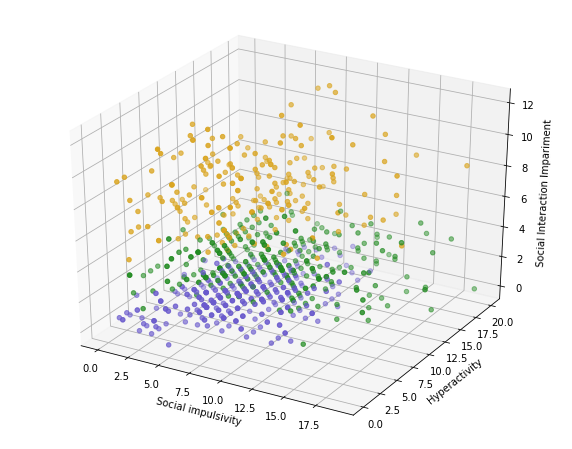

In [40]:

plt.figure(figsize=(10,8))
 
colors = ['slateblue', 'goldenrod','forestgreen']
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
 

ax.scatter(Factors_set['Social impulsivity'], Factors_set['Hyperactivity'] , Factors_set['Social Interaction Impariment'], c= label_DM , cmap = mcolors.ListedColormap(colors))
 

ax.set_xlabel(factor_name[2])
ax.set_ylabel(factor_name[5])
ax.set_zlabel(factor_name[0])
 
#plt.savefig('3DM_gmm.png', dpi=72, bbox_inches='tight')

plt.show()

In [41]:
train_DM

,Social impulsivity,Hyperactivity,Social Interaction Impariment
0,5,7,1
1,11,16,4
2,11,11,8
3,5,10,2
4,3,6,2
...,...,...,...
920,10,10,0
921,13,14,0
922,5,10,10
923,2,5,2


## PCA

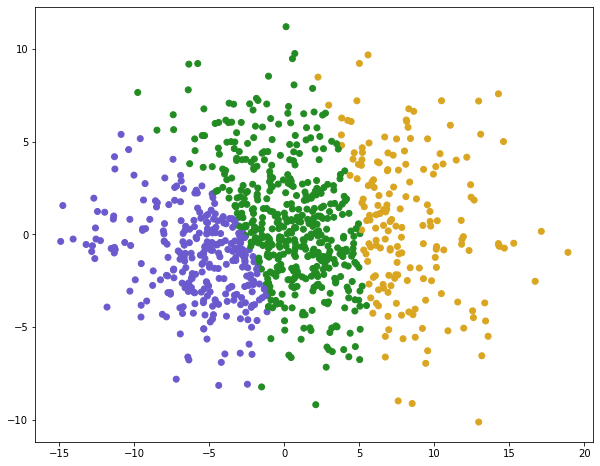

In [42]:
from sklearn.decomposition import PCA 

pca_2d=PCA(n_components=2) # Number of features needed
New_factor_2d=pca_2d.fit_transform(Factors_set)

gmm_2d = GaussianMixture(n_components=3,covariance_type='full', random_state=1).fit(New_factor_2d)
label_2DM = gmm_2d.predict(New_factor_2d )

plt.figure(figsize=(10,8))
 

plt.scatter(New_factor_2d[:,0] ,New_factor_2d [:,1] ,c= label_2DM, cmap = mcolors.ListedColormap(colors))

#plt.savefig('2D_pca_gmm.png', dpi=72, bbox_inches='tight')

plt.show()

In [43]:
from sklearn.decomposition import PCA 

pca=PCA(n_components=3) # Number of features needed
New_factor_3d=pca.fit_transform(Factors_set)
New_factor_3d.shape

(925, 3)

<Figure size 720x576 with 0 Axes>

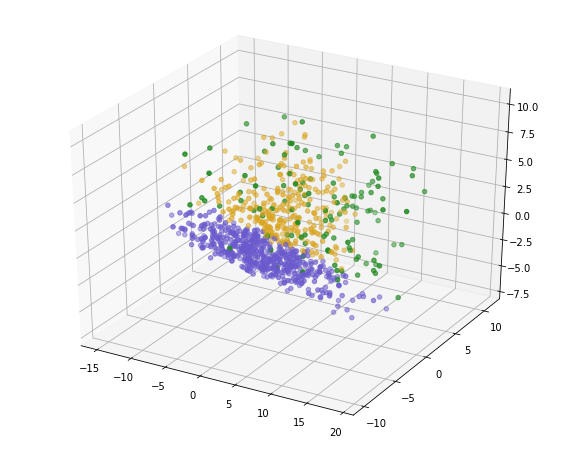

In [44]:
gmm_3d = GaussianMixture(n_components=3,covariance_type='full', random_state=1).fit(New_factor_3d)
label_DM = gmm_3d.predict(New_factor_3d)
plt.figure(figsize=(10,8))

 
colors = ['slateblue', 'goldenrod','forestgreen']
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
 

ax.scatter(New_factor_3d[:,0] , New_factor_3d[:,1] , New_factor_3d[:,2], c= label_DM , cmap = mcolors.ListedColormap(colors))
 

 
 
#plt.savefig('3DM_gmm_pca.png', dpi=72, bbox_inches='tight')

plt.show()

In [45]:
## Kernel PCA

<Figure size 720x576 with 0 Axes>

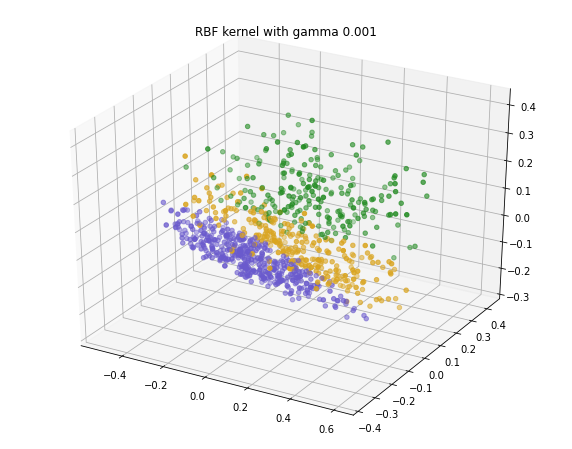

In [72]:
import numpy as numpy
import matplotlib.pyplot as plt 
from sklearn.decomposition import PCA, KernelPCA
from sklearn.datasets import make_circles

kpca = KernelPCA(n_components=3, kernel='rbf',gamma = 0.001)


kpca_factor = kpca.fit_transform(Factors_set)
gmm_3d_kpca = GaussianMixture(n_components=3,covariance_type='full', random_state=1).fit(kpca_factor)
label_DM_kpca = gmm_3d_kpca.predict(kpca_factor)
plt.figure(figsize=(10,8))

 
colors = ['slateblue', 'goldenrod','forestgreen']
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
 

ax.scatter(kpca_factor[:,0] , kpca_factor[:,1] , kpca_factor[:,2], c= label_DM_kpca , cmap = mcolors.ListedColormap(colors))
plt.title('RBF kernel with gamma 0.001')


 
 
#plt.savefig('3DM_gmm_kpca.png', dpi=72, bbox_inches='tight')

plt.show()

<Figure size 720x576 with 0 Axes>

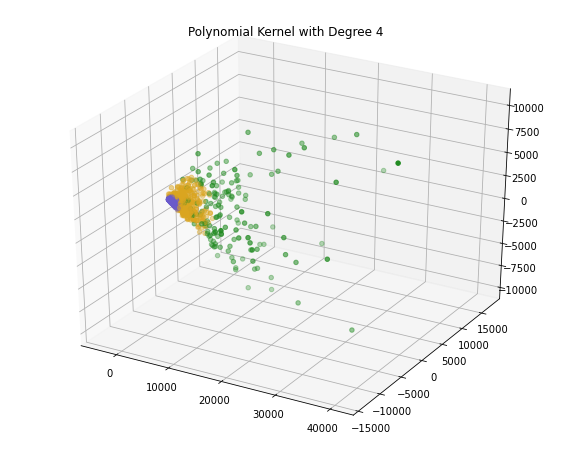

In [78]:
kpca = KernelPCA(n_components=3, kernel='poly', degree = 4)


kpca_factor = kpca.fit_transform(Factors_set)
gmm_3d_kpca = GaussianMixture(n_components=3,covariance_type='full', random_state=1).fit(kpca_factor)
label_DM_kpca = gmm_3d_kpca.predict(kpca_factor)
plt.figure(figsize=(10,8))

 
colors = ['slateblue', 'goldenrod','forestgreen']
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
 

ax.scatter(kpca_factor[:,0] , kpca_factor[:,1] , kpca_factor[:,2], c= label_DM_kpca , cmap = mcolors.ListedColormap(colors))
plt.title('Polynomial Kernel with Degree 4')

 
 
#plt.savefig('3DM_gmm_kpca_poly.png', dpi=72, bbox_inches='tight')

plt.show()

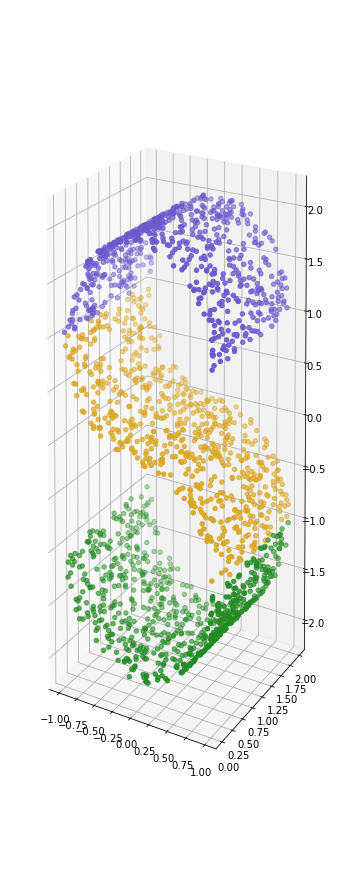

In [105]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.datasets import make_s_curve

x,y = make_s_curve(2000, random_state=1)
fig = plt.figure(figsize=(6,16))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x[:, 0], x[:, 1], x[:, 2], c=y, cmap=mcolors.ListedColormap(colors))
ax.view_init(10,-60)
#plt.savefig('s_curve.png', dpi=72, bbox_inches='tight')

In [107]:
from sklearn import manifold 
from sklearn.decomposition import KernelPCA
MDS_Y = manifold.MDS(n_components= 3, max_iter=100, n_init = 1).fit_transform(x)
isomap_Y = manifold.Isomap(n_components = 3, n_neighbors = 10).fit_transform(x)
KPCA_Y = KernelPCA(n_components= 3 ).fit_transform(x)


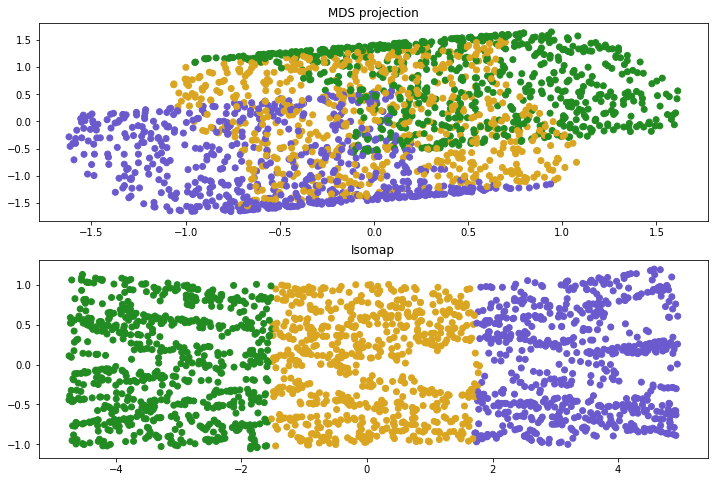

In [111]:
plt.figure(figsize=(12, 8))
plt.subplot(2,1,1)
plt.title('MDS projection')
plt.scatter(MDS_Y[:,0], MDS_Y[:,1], c=y, cmap=mcolors.ListedColormap(colors))

plt.subplot(2,1,2)
plt.title('Isomap')
plt.scatter(isomap_Y[:,0], isomap_Y[:,1], c=y, cmap=mcolors.ListedColormap(colors))

#plt.savefig('3DM_gmm_kpca_poly.png', dpi=72, bbox_inches='tight')

In [ ]:
### A dataset from UCI 

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv('datasets_heart.csv')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
age         303 non-null int64
sex         303 non-null int64
cp          303 non-null int64
trestbps    303 non-null int64
chol        303 non-null int64
fbs         303 non-null int64
restecg     303 non-null int64
thalach     303 non-null int64
exang       303 non-null int64
oldpeak     303 non-null float64
slope       303 non-null int64
ca          303 non-null int64
thal        303 non-null int64
target      303 non-null int64
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [5]:
df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


Text(0.5, 0, ' Woma / Man')

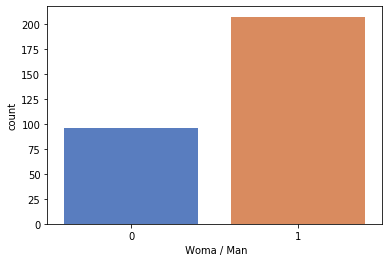

In [6]:
sns.countplot(x='sex',data=df,palette="muted")
plt.xlabel(" Woma / Man")


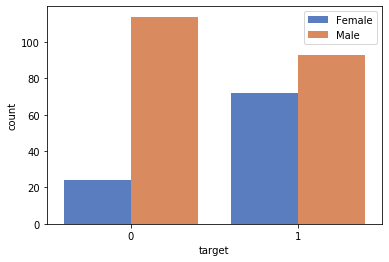

In [7]:
sns.countplot(hue='sex',x='target', data=df,palette="muted")
plt.legend(labels=['Female', 'Male'])

In [8]:
female_data= df [ df['sex']==0] #Only consider female
female_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96 entries, 2 to 302
Data columns (total 14 columns):
age         96 non-null int64
sex         96 non-null int64
cp          96 non-null int64
trestbps    96 non-null int64
chol        96 non-null int64
fbs         96 non-null int64
restecg     96 non-null int64
thalach     96 non-null int64
exang       96 non-null int64
oldpeak     96 non-null float64
slope       96 non-null int64
ca          96 non-null int64
thal        96 non-null int64
target      96 non-null int64
dtypes: float64(1), int64(13)
memory usage: 11.2 KB


In [9]:
feature_lis = ['trestbps','oldpeak','age']

feature_1 = female_data[feature_lis[0]]
feature_2 =  female_data[feature_lis[1]]
feature_3 =    female_data[feature_lis[2]]
target =   female_data['target']
target

2      1
4      1
6      1
11     1
14     1
      ..
289    0
292    0
296    0
298    0
302    0
Name: target, Length: 96, dtype: int64

In [10]:
colors = [ 'forestgreen', 'red']

plt.scatter(feature_1, c= target, cmap = mcolors.ListedColormap(colors)
plt.show()


SyntaxError: invalid syntax (<ipython-input-10-82438acb0d84>, line 4)

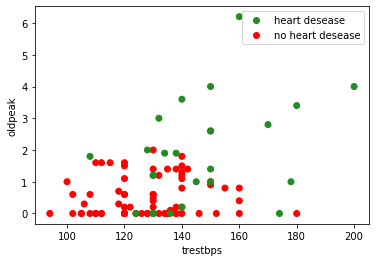

In [11]:
import matplotlib.colors as mcolors
colors = [ 'forestgreen', 'red']
scatter = plt.scatter(feature_1, feature_2, c= target, cmap = mcolors.ListedColormap(colors))
plt.xlabel(feature_lis[0])
plt.ylabel(feature_lis[1])
plt.legend(handles=scatter.legend_elements()[0], labels=['heart desease', 'no heart desease'])
plt.show()

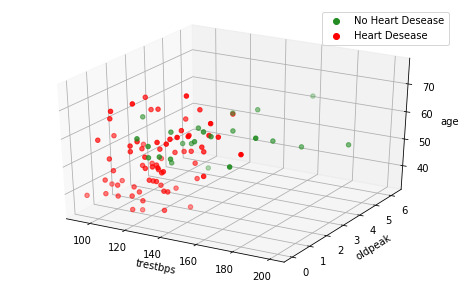

In [12]:
from mpl_toolkits.mplot3d import Axes3D
fig2 = plt.figure(2,figsize = (8,5))
ax = fig2.add_subplot(111, projection='3d')
ax.scatter(feature_1, feature_2, feature_3, c= target, cmap = mcolors.ListedColormap(colors))
plt.legend(handles=scatter.legend_elements()[0], labels=['No Heart Desease', 'Heart Desease'])
ax.set_xlabel(feature_lis[0])
ax.set_ylabel(feature_lis[1])
ax.set_zlabel(feature_lis[2])
plt.show()

In [13]:
X = female_data[feature_lis]

In [14]:
from sklearn.neighbors import KNeighborsClassifier
knn_clf = KNeighborsClassifier(n_neighbors=5)
knn_clf.fit(X, target)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

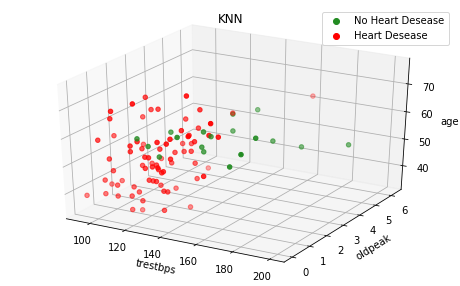

In [15]:
y_pred = knn_clf.predict(X)
fig3 = plt.figure(10,figsize = (8,5))
ax = fig3.add_subplot(111, projection='3d')
ax.scatter(feature_1, feature_2, feature_3, c= y_pred, cmap = mcolors.ListedColormap(colors))
plt.legend(handles=scatter.legend_elements()[0], labels=['No Heart Desease', 'Heart Desease'])

ax.set_xlabel(feature_lis[0])
ax.set_ylabel(feature_lis[1])
ax.set_zlabel(feature_lis[2])
ax.set_title('KNN')
plt.show()

In [16]:
from sklearn.metrics import accuracy_score
accuracy_score(target, y_pred)

0.8333333333333334

In [17]:
from sklearn.mixture import GaussianMixture

gmm_clf = GaussianMixture(n_components=2, random_state =1)
gmm_clf.fit(X)

GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=100,
                means_init=None, n_components=2, n_init=1, precisions_init=None,
                random_state=1, reg_covar=1e-06, tol=0.001, verbose=0,
                verbose_interval=10, warm_start=False, weights_init=None)

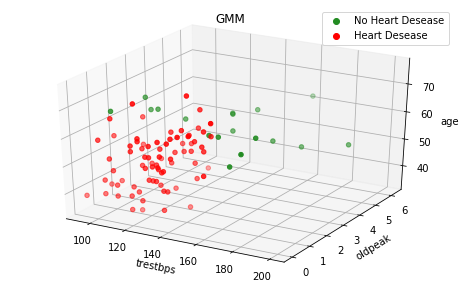

0.75


In [18]:
y_pred = gmm_clf.predict(X)
fig3 = plt.figure(3,figsize = (8,5))
ax = fig3.add_subplot(111, projection='3d')
ax.scatter(feature_1, feature_2, feature_3, c= y_pred, cmap = mcolors.ListedColormap(colors))
plt.legend(handles=scatter.legend_elements()[0], labels=['No Heart Desease', 'Heart Desease'])

ax.set_xlabel(feature_lis[0])
ax.set_ylabel(feature_lis[1])
ax.set_zlabel(feature_lis[2])
ax.set_title('GMM')
plt.show()
print(accuracy_score(target, y_pred))


In [19]:
from sklearn.ensemble import IsolationForest

isofo_clf = IsolationForest( contamination = 0.08)

isofo_clf.fit(X)
y_pred = isofo_clf.predict(X)

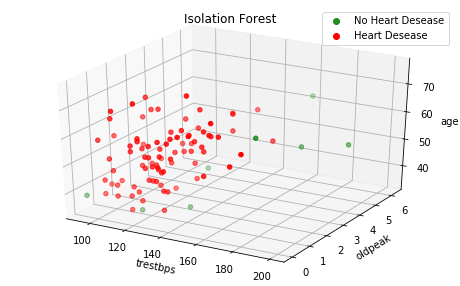

0.71875


In [20]:
fig4 = plt.figure(4,figsize = (8,5))
ax = fig4.add_subplot(111, projection='3d')
ax.scatter(feature_1, feature_2, feature_3, c= y_pred, cmap = mcolors.ListedColormap(colors))
plt.legend(handles=scatter.legend_elements()[0], labels=['No Heart Desease', 'Heart Desease'])

ax.set_xlabel(feature_lis[0])
ax.set_ylabel(feature_lis[1])
ax.set_zlabel(feature_lis[2])
ax.set_title('Isolation Forest')
plt.show()
print(accuracy_score(target, y_pred))


In [21]:
 from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2, random_state=1).fit(X)
y_pred = kmeans.predict(X)

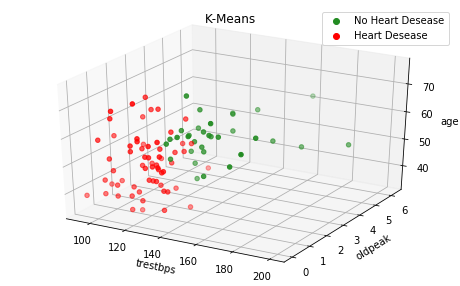

0.71875


In [22]:
fig5 = plt.figure(5,figsize = (8,5))
ax = fig5.add_subplot(111, projection='3d')
ax.scatter(feature_1, feature_2, feature_3, c= y_pred, cmap = mcolors.ListedColormap(colors))
plt.legend(handles=scatter.legend_elements()[0], labels=['No Heart Desease', 'Heart Desease'])
y_pred = isofo_clf.predict(X)
ax.set_xlabel(feature_lis[0])
ax.set_ylabel(feature_lis[1])
ax.set_zlabel(feature_lis[2])
ax.set_title('K-Means')
plt.show()
print(accuracy_score(target, y_pred))

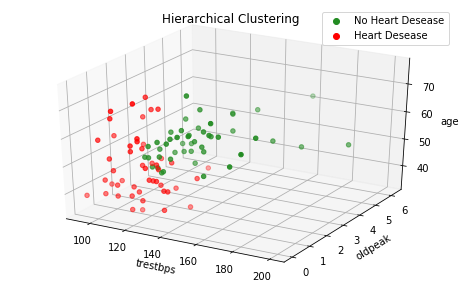

0.6666666666666666


In [23]:
from sklearn.cluster import AgglomerativeClustering
clus = AgglomerativeClustering(n_clusters=2).fit(X)
y_pred = clus.fit_predict(X)
fig5 = plt.figure(5,figsize = (8,5))
ax = fig5.add_subplot(111, projection='3d')
colors = ['forestgreen','red']

ax.scatter(feature_1, feature_2, feature_3, c= y_pred, cmap = mcolors.ListedColormap(colors))
plt.legend(handles=scatter.legend_elements()[0], labels=['No Heart Desease', 'Heart Desease'])

ax.set_xlabel(feature_lis[0])
ax.set_ylabel(feature_lis[1])
ax.set_zlabel(feature_lis[2])
ax.set_title('Hierarchical Clustering')
plt.show()
print(accuracy_score(target, y_pred))

Text(0.5, 0.92, 'PCA')

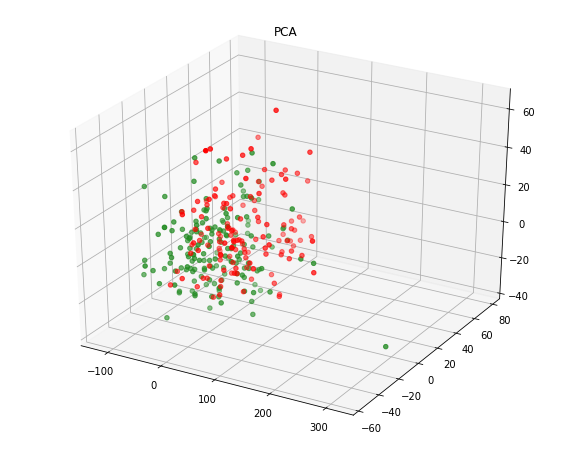

In [29]:
from sklearn.decomposition import PCA

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
pca=PCA(n_components=3,svd_solver='full').fit_transform(df)  
ax.scatter(pca[:,0] , pca[:,1] , pca[:,2], c= df.target.values, cmap = mcolors.ListedColormap(colors))
#ax.view_init(elev=60, azim=-30)
plt.title('PCA')

In [35]:
pca=PCA(n_components=3,svd_solver='full').fit(df)  
print (pca.explained_variance_)
print (pca.explained_variance_ratio_)
print (pca.explained_variance_ratio_.cumsum())

[2695.8673023   542.31097479  305.07441956]
[0.74751318 0.15037261 0.08459139]
[0.74751318 0.89788579 0.98247718]


In [30]:
from sklearn import manifold 
from sklearn.decomposition import KernelPCA

pca=PCA(n_components=3).fit_transform(df)
MDS_Y = manifold.MDS(n_components= 3, max_iter=100, n_init = 2).fit_transform(df)

KPCA_Y = KernelPCA(n_components= 3,kernel='poly',degree = 10).fit_transform(df)

Text(0.5, 0.92, 'KPCA-')

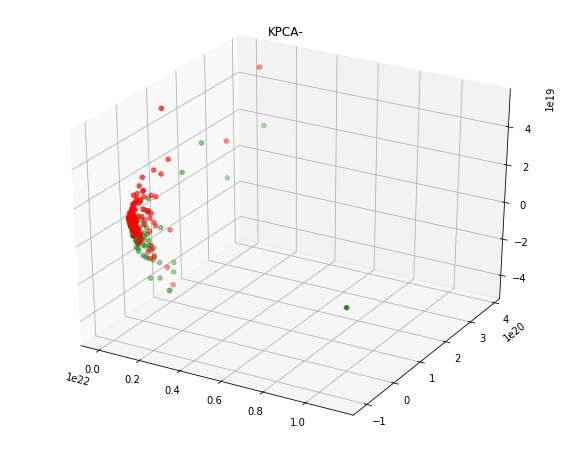

In [31]:
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
 
colors = ['red', 'forestgreen']

ax.scatter(KPCA_Y[:,0] , KPCA_Y[:,1] , KPCA_Y[:,2], c= df.target.values, cmap = mcolors.ListedColormap(colors))
plt.title('KPCA')
#plt.savefig('3DM_gmm_kpca_poly.png', dpi=72, bbox_inches='tight')

Text(0.5, 0.92, 'Isomap')

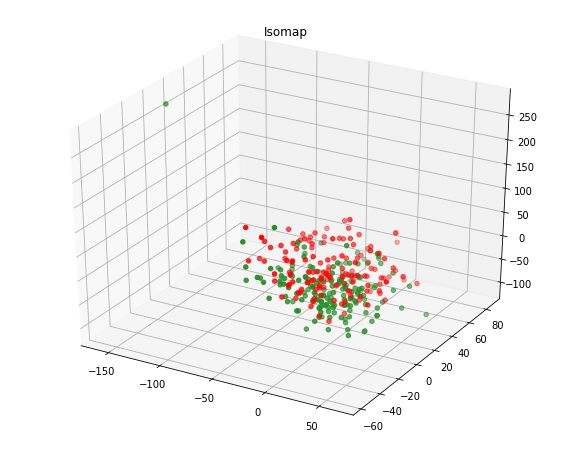

In [32]:
isomap_Y = manifold.Isomap(n_components = 3, n_neighbors = 10).fit_transform(df)
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(MDS_Y [:,0] , MDS_Y [:,1] , MDS_Y [:,2], c= df.target.values, cmap = mcolors.ListedColormap(colors))
plt.title('Isomap')